In [1]:
from vae import VAE, Encoder, Decoder
import torch
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
from dataset import CelebADataset
import pandas as pd
from visualizations import plot_img, plot_img_and_recon

In [2]:
root_dir = "data/celeba/img_align_celeba"
attr_file_path = "data/celeba/list_attr_celeba.txt"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
df = pd.read_csv(attr_file_path, sep = "\s+", header = 1, index_col = 0)
df_smile = df[df["Smiling"] == 1]
df_neutral = df[df["Smiling"] == -1]

In [4]:
smile_list = df_smile.index.tolist()
neutral_list = df_neutral.index.tolist()

In [5]:
transform = transforms.Compose([
    transforms.Resize((64,64)),
    transforms.ToTensor(),
])

smile_dataset = CelebADataset(root_dir, smile_list, transform)
neutral_dataset = CelebADataset(root_dir, neutral_list, transform)

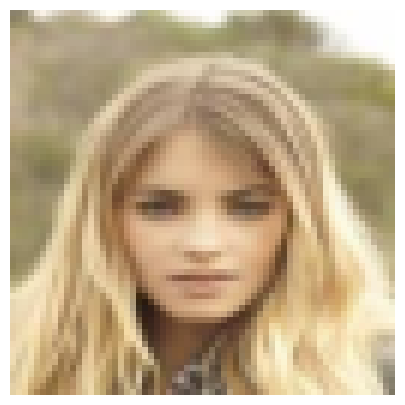

In [6]:
plot_img(neutral_dataset[8][0])

In [7]:
smile_dataloader = DataLoader(smile_dataset, batch_size = 256, shuffle = False)
neutral_dataloader = DataLoader(neutral_dataset, batch_size = 256, shuffle = False)

In [8]:
vae = VAE(latent_dim = 128)
vae.load_state_dict(torch.load('weights2.pth'))
vae.eval()
vae.to(device)

VAE(
  (encoder): Encoder(
    (relu): ReLU()
    (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc_mu): Linear(in_features=4096, out_features=128, bias=True)
    (fc_var): Linear(in_features=4096, out_features=128, bias=True)
  )
  (decoder): Decoder(
    (proj): Linear(in_features=128, out_features=4096, bias=True)
    (relu): ReLU()
    (conv_t1): ConvTrans

In [9]:
def get_latent_vectors(model, loader, device):
    model.eval() 
    
    all_vectors = [] 
    
    with torch.no_grad(): 
        for img, _ in loader:
            img = img.to(device)
            mu, _ = model.encoder(img)
            all_vectors.append(mu.cpu())
    return torch.cat(all_vectors, dim=0)
        
        

In [24]:
smile_matrix = get_latent_vectors(vae, smile_dataloader, device)
neutral_matrix = get_latent_vectors(vae, neutral_dataloader, device)

In [25]:
mean_smile = torch.mean(smile_matrix, dim=0)
mean_neutral = torch.mean(neutral_matrix, dim=0)

smile_vector = mean_smile - mean_neutral

In [10]:
def add_smile_to_img(model, img, smile_vector, device,alfa = 1.0):
    
    img = img.unsqueeze(0).to(device)
    smile_vector = smile_vector.unsqueeze(0).to(device)
    mu, log_var = model.encoder(img)
    mu+=(smile_vector*alfa)

    smile_img = model.decoder(mu)
    smile_img = smile_img.detach().cpu().squeeze()

    plot_img_and_recon(img.squeeze().cpu(), smile_img)
    

    
    

In [11]:
smile_vector = torch.tensor([
    -0.0075, -0.0131, -0.0696, -0.0669, -0.4754, -0.1382,  0.3869, -0.0371,
     0.1220,  0.2153,  0.0294, -0.2065,  0.0486, -0.1213, -0.0151, -0.0731,
    -0.0754,  0.1450, -0.0497, -0.0012, -0.2454, -0.0436, -0.0490, -0.0482,
    -0.1092, -0.0582, -0.0423, -0.0039,  0.0005,  0.0216, -0.4679, -0.2216,
     0.1386,  0.1156,  0.1082, -0.2277, -0.0204,  0.0162,  0.0131, -0.0178,
    -0.0484, -0.0330, -0.1010, -0.0282,  0.1971,  0.0463,  0.0093, -0.0435,
     0.0051,  0.0164, -0.0141, -0.0247,  0.0352, -0.1163, -0.0292, -0.0841,
    -0.3172,  0.0116,  0.2388, -0.0952, -0.0644,  0.0030, -0.0021,  0.0462,
     0.1178,  0.0133, -0.0901, -0.0973, -0.2042, -0.0018,  0.0810,  0.0212,
    -0.3115, -0.0241, -0.3282,  0.0006, -0.4337,  0.0527, -0.0344, -0.0454,
    -0.0027, -0.0022, -0.0047,  0.0142,  0.2454,  0.0325,  0.0293,  0.0028,
    -0.0338,  0.1090,  0.1078, -0.0029,  0.0077, -0.0128,  0.0175, -0.2034,
    -0.0552, -0.0033, -0.0539,  0.0060,  0.0269, -0.2032, -0.0046, -0.0727,
    -0.0012, -0.0418,  0.0017, -0.0530,  0.2070,  0.0164,  0.0438,  0.0364,
    -0.0669,  0.0092,  0.2232, -0.0137, -0.0796, -0.2404, -0.1890,  0.0301,
     0.0729,  0.1735,  0.2100, -0.0197, -0.3025,  0.1064,  0.0292,  0.0178
])

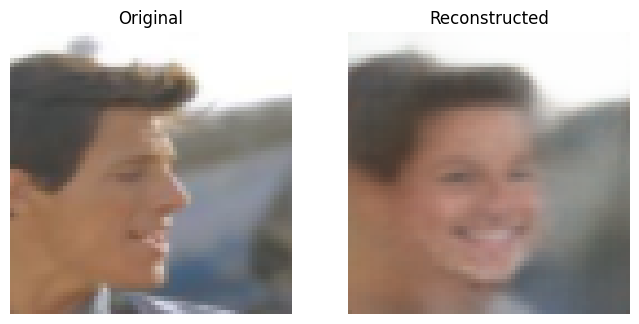

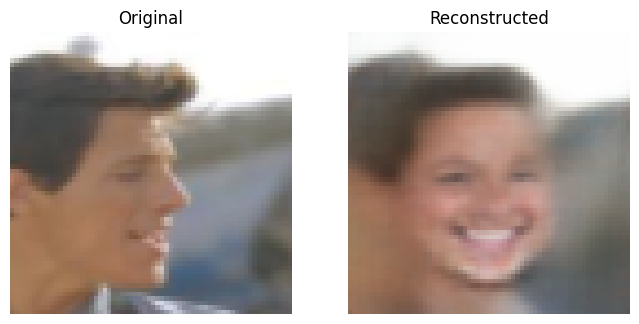

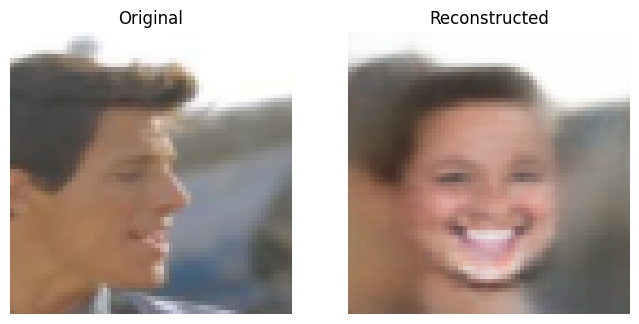

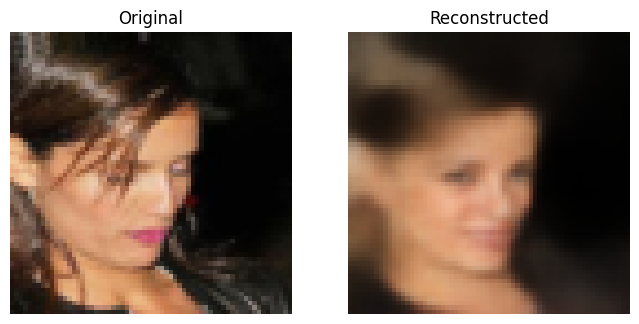

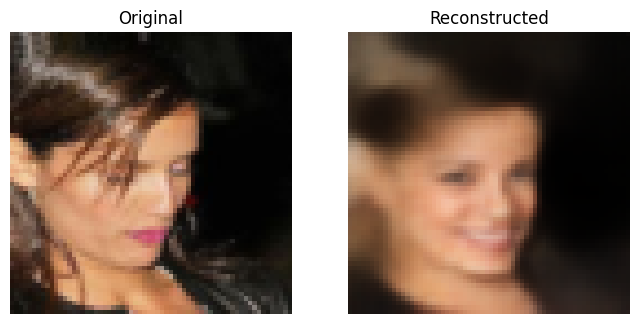

...

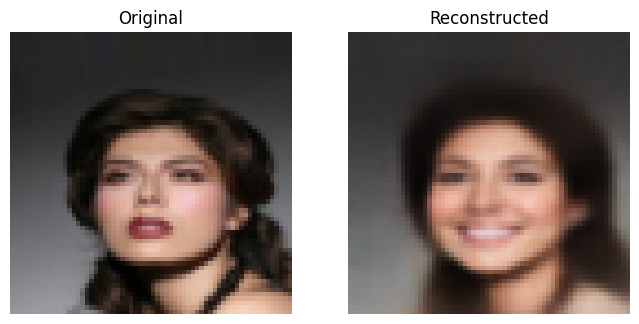

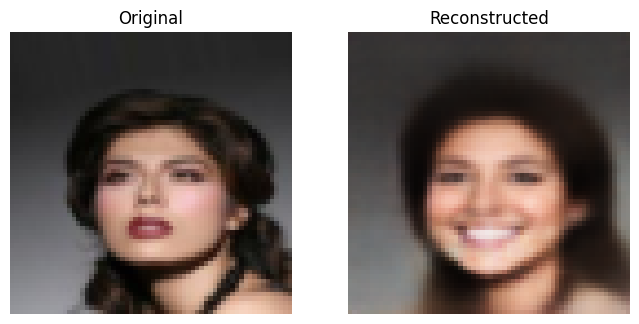

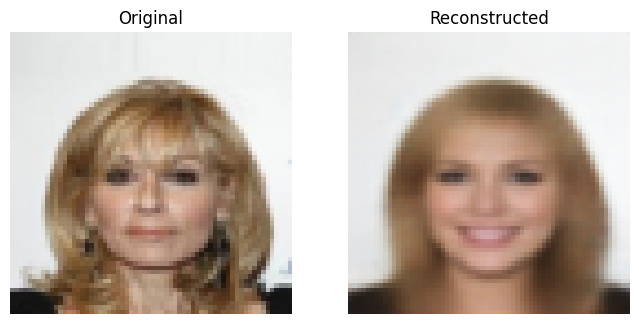

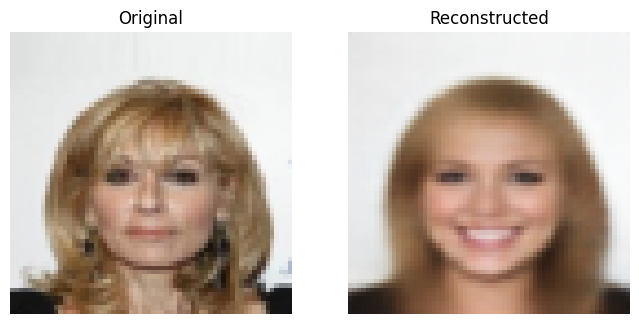

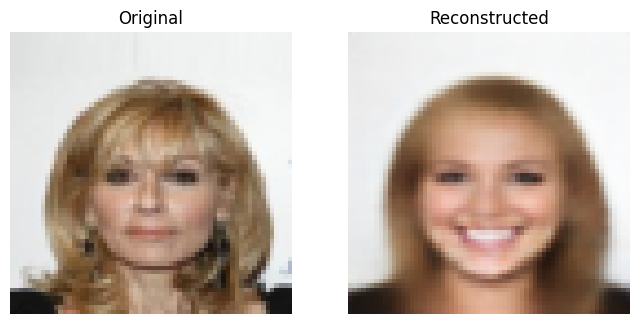

In [18]:
for i in range(150):
    for alpha in range(1, 4, 1):
        add_smile_to_img(vae, neutral_dataset[i][0], smile_vector, device, alpha)


In [33]:
smile_vector

tensor([-0.0075, -0.0131, -0.0696, -0.0669, -0.4754, -0.1382,  0.3869, -0.0371,
         0.1220,  0.2153,  0.0294, -0.2065,  0.0486, -0.1213, -0.0151, -0.0731,
        -0.0754,  0.1450, -0.0497, -0.0012, -0.2454, -0.0436, -0.0490, -0.0482,
        -0.1092, -0.0582, -0.0423, -0.0039,  0.0005,  0.0216, -0.4679, -0.2216,
         0.1386,  0.1156,  0.1082, -0.2277, -0.0204,  0.0162,  0.0131, -0.0178,
        -0.0484, -0.0330, -0.1010, -0.0282,  0.1971,  0.0463,  0.0093, -0.0435,
         0.0051,  0.0164, -0.0141, -0.0247,  0.0352, -0.1163, -0.0292, -0.0841,
        -0.3172,  0.0116,  0.2388, -0.0952, -0.0644,  0.0030, -0.0021,  0.0462,
         0.1178,  0.0133, -0.0901, -0.0973, -0.2042, -0.0018,  0.0810,  0.0212,
        -0.3115, -0.0241, -0.3282,  0.0006, -0.4337,  0.0527, -0.0344, -0.0454,
        -0.0027, -0.0022, -0.0047,  0.0142,  0.2454,  0.0325,  0.0293,  0.0028,
        -0.0338,  0.1090,  0.1078, -0.0029,  0.0077, -0.0128,  0.0175, -0.2034,
        -0.0552, -0.0033, -0.0539,  0.00